# CxC UW Touch Bistro  

## Imports and Data Loading 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error

In [ ]:
sns.set(style="whitegrid")

In [2]:
df_bills = pd.read_csv("bills.csv", parse_dates = ["bill_paid_at_local", "business_date"])

In [3]:
df_bills.head()

,bill_paid_at_local,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,bill_total_tax,bill_total_voided,bill_uuid,business_date,order_duration_seconds,order_seated_at_local,order_closed_at_local,order_take_out_type_label,order_uuid,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax,venue_xref_id,waiter_uuid
0,2024-07-01 09:17:01,21.81,0.0,0.0,19.30,2.51,0.0,240701091701~4D63608F-523C-4EFF-9A4F-78D6C44B5159,2024-07-01,46,2024-07-01 09:16:15,2024-07-01 09:17:01,dinein,240701091615~EF1C6E91-B6C4-4DF1-8A92-1B024197FEC3,21.81,1,0.0,21.81,39e5b4830d4d9c14db7368a95b65d5463ea3d095203737...,161027134744~719D0E09-5CA7-442A-B9FA-BBBF4083B4FD
1,2024-07-01 13:37:00,48.95,0.0,0.0,43.32,5.63,0.0,240701133659~3A0BEDE2-E9E5-484D-B909-780E485F0D69,2024-07-01,288,2024-07-01 13:32:12,2024-07-01 13:37:00,dinein,240701133212~A4C33BFA-A54F-4627-B0C2-7428427FB5DE,48.95,1,0.0,48.95,39e5b4830d4d9c14db7368a95b65d5463ea3d095203737...,161027134744~719D0E09-5CA7-442A-B9FA-BBBF4083B4FD
2,2024-07-01 11:19:32,26.94,0.0,0.0,23.84,3.10,0.0,240701111931~670EEB85-E939-4924-B92F-C95076B7E930,2024-07-01,135,2024-07-01 11:17:17,2024-07-01 11:19:32,dinein,240701111717~6074B0AB-2432-484D-BC3F-55CC5D731818,26.94,1,0.0,26.94,39e5b4830d4d9c14db7368a95b65d5463ea3d095203737...,161027134744~719D0E09-5CA7-442A-B9FA-BBBF4083B4FD
3,2024-07-01 15:05:59,3.96,0.0,0.0,3.77,0.19,0.0,240701150558~3D6F473E-D5EF-4BB8-AFAB-30DB2A0764C0,2024-07-01,48,2024-07-01 15:05:11,2024-07-01 15:05:59,dinein,240701150511~EAA68F41-20ED-4FC7-B902-B0B3878AEC82,3.96,1,0.0,3.96,39e5b4830d4d9c14db7368a95b65d5463ea3d095203737...,161027134744~719D0E09-5CA7-442A-B9FA-BBBF4083B4FD
4,2024-07-01 12:41:00,3.36,0.0,0.0,3.20,0.16,0.0,240701124059~0521794C-51FC-4C30-A368-995CE4DE105F,2024-07-01,103,2024-07-01 12:39:17,2024-07-01 12:41:00,dinein,240701123917~27764E1C-7E7F-4293-ABC7-5921310A654A,3.36,1,0.0,3.36,39e5b4830d4d9c14db7368a95b65d5463ea3d095203737...,161027134744~719D0E09-5CA7-442A-B9FA-BBBF4083B4FD


In [4]:
df_bills.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8954786 entries, 0 to 8954785
Data columns (total 20 columns):
 #   Column                          Dtype         
---  ------                          -----         
 0   bill_paid_at_local              datetime64[ns]
 1   bill_total_billed               float64       
 2   bill_total_discount_item_level  float64       
 3   bill_total_gratuity             float64       
 4   bill_total_net                  float64       
 5   bill_total_tax                  float64       
 6   bill_total_voided               float64       
 7   bill_uuid                       object        
 8   business_date                   datetime64[ns]
 9   order_duration_seconds          int64         
 10  order_seated_at_local           object        
 11  order_closed_at_local           object        
 12  order_take_out_type_label       object        
 13  order_uuid                      object        
 14  payment_amount                  float64       
 15

In [5]:
df_bills.describe()

,bill_paid_at_local,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,bill_total_tax,bill_total_voided,business_date,order_duration_seconds,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax
count,8954786,8.954786e+06,8.954786e+06,8.954786e+06,8.954786e+06,8.954786e+06,8.954786e+06,8954786,8.954786e+06,8.954786e+06,8.954786e+06,8.954786e+06,8.954786e+06
mean,2024-09-26 12:26:41.071778816,3.674831e+01,8.403802e-01,2.408956e-01,3.389894e+01,2.849375e+00,9.375093e-01,2024-09-25 20:08:50.833184768,8.790968e+03,4.063878e+01,9.844425e-01,3.654212e+00,3.674902e+01
min,2024-07-01 00:00:01,-5.731500e+03,-9.164000e+01,-6.000000e+01,-5.072120e+03,-6.593800e+02,-4.501500e+03,2024-07-01 00:00:00,-4.400000e+01,-5.731500e+03,0.000000e+00,-2.531400e+02,-5.731500e+03
25%,2024-08-12 12:20:46.249999872,1.044000e+01,0.000000e+00,0.000000e+00,9.630000e+00,4.600000e-01,0.000000e+00,2024-08-12 00:00:00,1.100000e+02,1.097000e+01,1.000000e+00,0.000000e+00,1.044000e+01
50%,2024-09-23 22:52:23,2.189000e+01,0.000000e+00,0.000000e+00,2.000000e+01,1.440000e+00,0.000000e+00,2024-09-23 00:00:00,1.159000e+03,2.347000e+01,1.000000e+00,0.000000e+00,2.189000e+01
75%,2024-11-09 09:56:19.500000,4.465000e+01,0.000000e+00,0.000000e+00,4.100000e+01,3.450000e+00,0.000000e+00,2024-11-09 00:00:00,3.377000e+03,4.887000e+01,1.000000e+00,4.070000e+00,4.465000e+01
max,2025-01-01 21:41:43,7.492861e+04,5.490920e+03,1.193553e+04,6.630850e+04,8.620110e+03,1.000000e+06,2024-12-31 00:00:00,2.894124e+08,5.227523e+05,4.100000e+01,5.227156e+05,7.492861e+04
std,NaN,8.337650e+01,9.404221e+00,8.409234e+00,7.754356e+01,7.153385e+00,3.365966e+02,NaN,3.984398e+05,1.987292e+02,1.926432e-01,1.753186e+02,8.337668e+01


In [6]:
df_venues = pd.read_csv("venues.csv")

In [7]:
df_venues.head()

,venue_xref_id,concept,city,country,start_of_day_offset
0,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00
1,e7cec41c46a9706ba1a702b368be5431913b6dc9c9da49...,FAMILY_DINING,Brooklyn,US,00:00:00
2,e63e79791883b0c4ac71d41eaee727932c13d6a4ec8f78...,FAST_CASUAL,Windsor,CA,00:00:00
3,c100388c9328b30b6bdfbea43f113d367ae9d32b03e84b...,BAR,Burnaby,CA,01:00:00
4,a819ee7f83f27dd3d7f44515e22aca3c26e6704ddd2a9b...,FAMILY_DINING,Tisdale,CA,00:00:00


In [8]:
new_df = pd.merge(df_venues, df_bills, on="venue_xref_id", how="inner")
print(new_df)

                                             venue_xref_id    concept  \
0        ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...  FAST_FOOD   
1        ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...  FAST_FOOD   
2        ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...  FAST_FOOD   
3        ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...  FAST_FOOD   
4        ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...  FAST_FOOD   
...                                                    ...        ...   
8954781  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...     BAKERY   
8954782  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...     BAKERY   
8954783  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...     BAKERY   
8954784  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...     BAKERY   
8954785  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...     BAKERY   

                city country start_of_day_offset  bill_paid_at_local  \
0        Albuquerque      US            00:00:00 20

## Peak Period Analysis & Staffing Recommendations

In [33]:
new_df["hour"] = new_df["bill_paid_at_local"].dt.hour  # Extract hour of the day
new_df["day_of_week"] = new_df["bill_paid_at_local"].dt.day_name()  # Extract weekday
new_df["business_date"] = pd.to_datetime(new_df["business_date"])  # Ensure correct format
new_df["is_weekend"] = new_df["day_of_week"].isin(["Saturday", "Sunday"])


new_df["order_take_out_type_label"] = new_df["order_take_out_type_label"].fillna("Unknown")

# Filter out unrealistic order durations (e.g., negative or >24h)
new_df = new_df[(new_df["order_duration_seconds"] > 0) & 
                (new_df["order_duration_seconds"] <= 86400)]


# Group by venue and hour to count orders
busiest_hours = new_df.groupby(["venue_xref_id", "hour"]).agg(
    orders=("order_uuid", "count"),  # Count number of orders
    total_revenue=("bill_total_billed", "sum")  # Sum total billed amount
).reset_index()

# Sort by number of orders per venue
busiest_hours = busiest_hours.sort_values(by=["venue_xref_id", "orders"], ascending=[True, False])

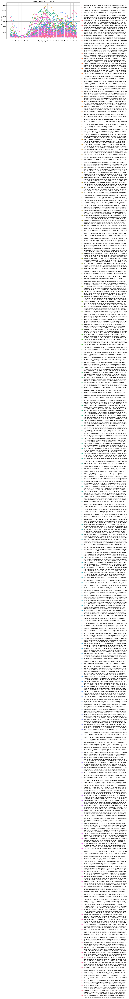

In [34]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=busiest_hours, x="hour", y="orders", hue="venue_xref_id", marker="o")

plt.title("Busiest Time Windows by Venue")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="Venue ID", bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

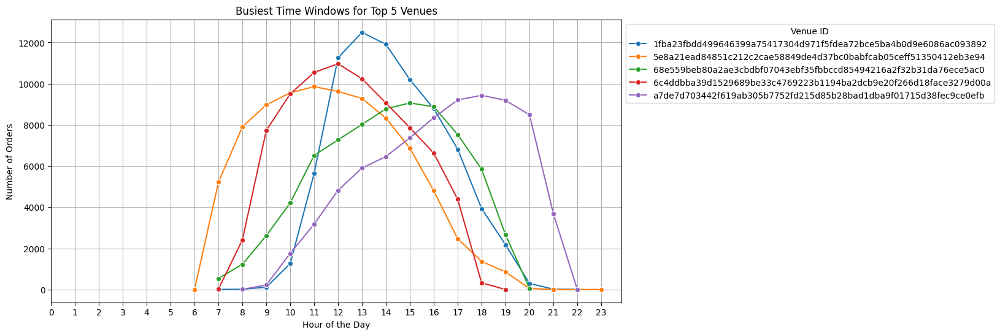

In [38]:
# Get the top most visited venues
top_5_venues = busiest_hours.groupby("venue_xref_id")["orders"].sum().nlargest(5).index

# Filter the dataset to only include these top 10 venues
filtered_busiest_hours = busiest_hours[busiest_hours["venue_xref_id"].isin(top_5_venues)]

# Plot the busiest time windows for the top 10 venues
plt.figure(figsize=(12, 6))
sns.lineplot(data=filtered_busiest_hours, x="hour", y="orders", hue="venue_xref_id", marker="o")

plt.title("Busiest Time Windows for Top 5 Venues")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="Venue ID", bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

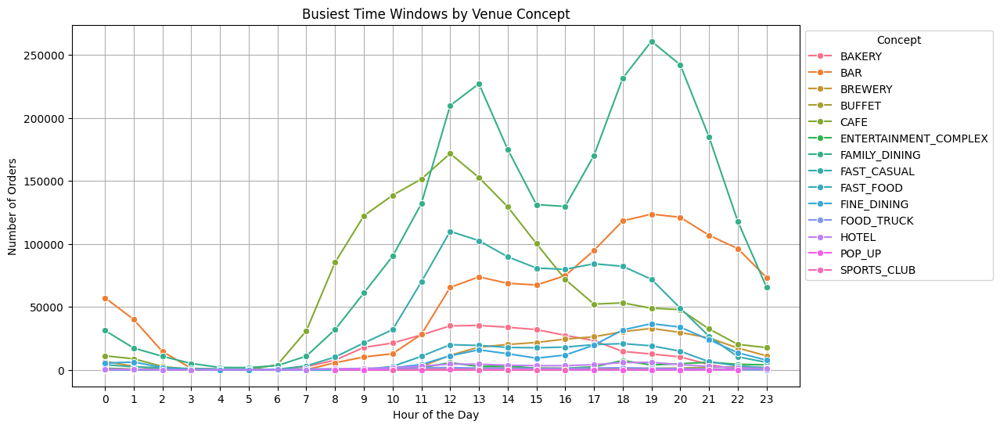

In [36]:
new_city_df = df_bills.merge(df_venues[["venue_xref_id", "city", "concept"]], on="venue_xref_id", how="left")

# Extract time features
new_city_df["hour"] = new_city_df["bill_paid_at_local"].dt.hour
new_city_df["day_of_week"] = new_city_df["bill_paid_at_local"].dt.day_name()
new_city_df["is_weekend"] = new_city_df["day_of_week"].isin(["Saturday", "Sunday"])

concept_trends = new_city_df.groupby(["hour", "concept"]).agg(
    orders=("order_uuid", "count"),
    total_revenue=("bill_total_billed", "sum")
).reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=concept_trends, x="hour", y="orders", hue="concept", marker="o")
plt.title("Busiest Time Windows by Venue Concept")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="Concept", bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

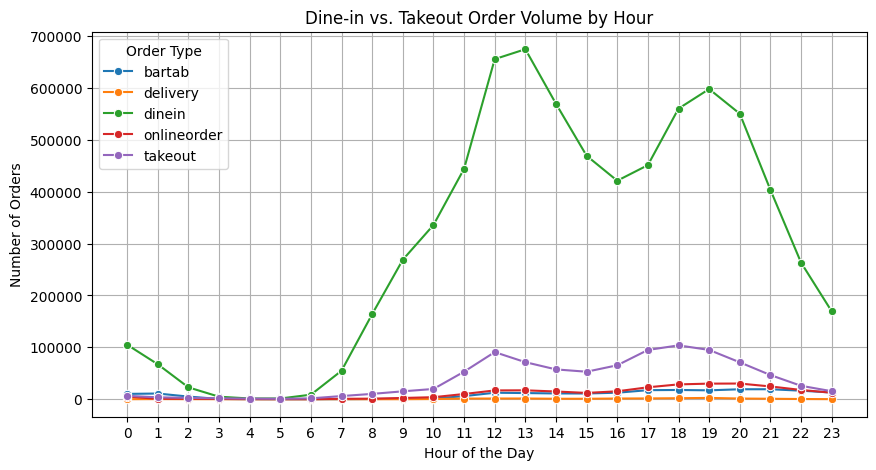

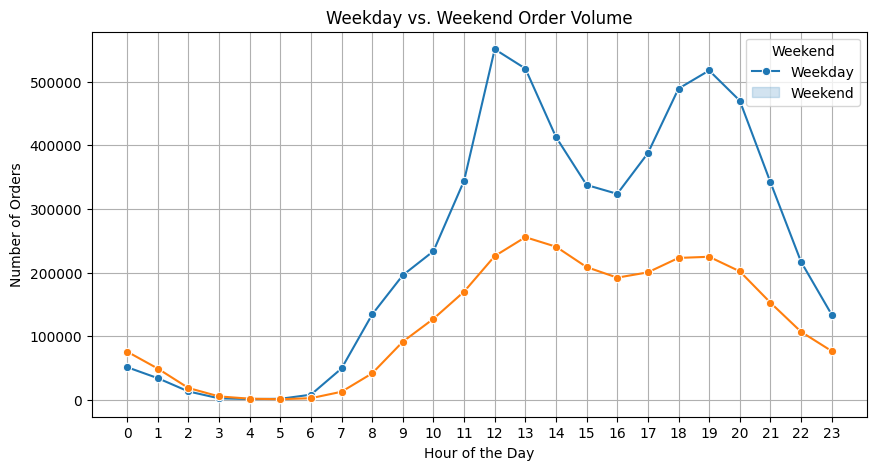

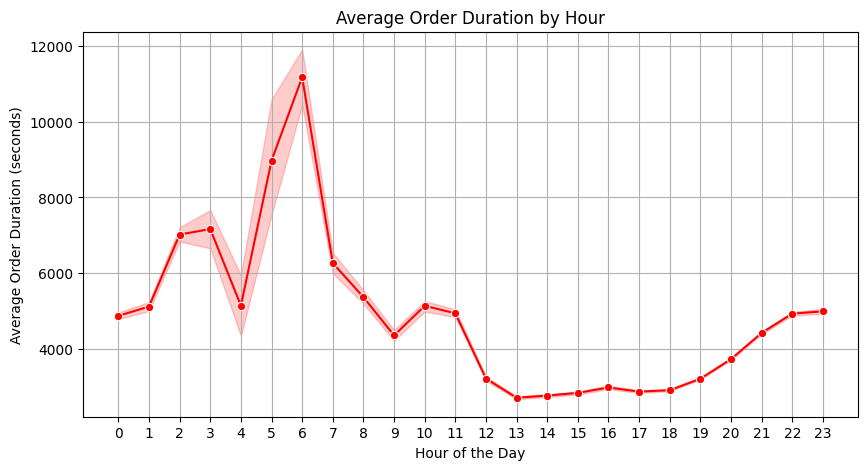

In [37]:
# Dine-in vs. Takeout Comparison by Hour
hourly_trends = new_df.groupby(["business_date", "hour", "venue_xref_id"]).agg(
    orders=("order_uuid", "count"),
    total_revenue=("bill_total_billed", "sum"),
    avg_order_duration=("order_duration_seconds", "mean"),
).reset_index()

order_type_trends = new_df.groupby(["hour", "order_take_out_type_label"]).agg(
    orders=("order_uuid", "count")
).reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=order_type_trends, x="hour", y="orders", hue="order_take_out_type_label", marker="o")
plt.title("Dine-in vs. Takeout Order Volume by Hour")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="Order Type")
plt.grid(True)
plt.show()

# Weekday vs. Weekend Analysis 
weekend_trends = new_df.groupby(["hour", "is_weekend"]).agg(
    orders=("order_uuid", "count")
).reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=weekend_trends, x="hour", y="orders", hue="is_weekend", marker="o")
plt.title("Weekday vs. Weekend Order Volume")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="Weekend", labels=["Weekday", "Weekend"])
plt.grid(True)
plt.show()

#Order Duration Impact Analysis
plt.figure(figsize=(10, 5))
sns.lineplot(data=hourly_trends, x="hour", y="avg_order_duration", marker="o", color="red")
plt.title("Average Order Duration by Hour")
plt.xlabel("Hour of the Day")
plt.ylabel("Average Order Duration (seconds)")
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()

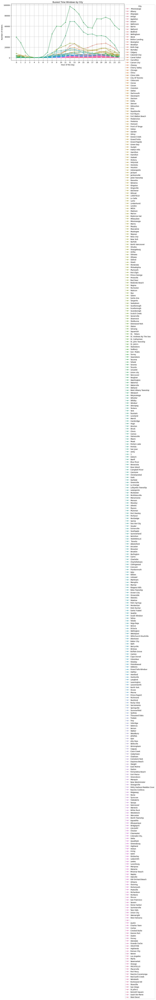

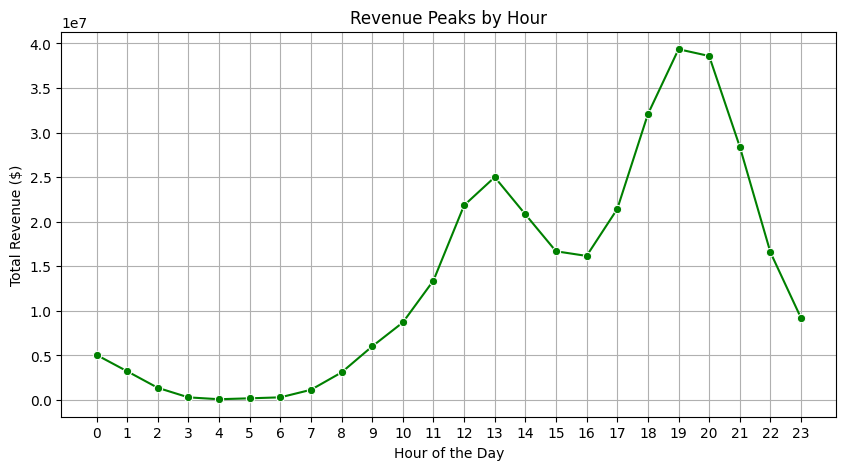

NameError: name 'venues_df' is not defined

In [39]:
#City-Based Analysis
city_trends = new_city_df.groupby(["hour", "city"]).agg(
    orders=("order_uuid", "count"),
    total_revenue=("bill_total_billed", "sum")
).reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=city_trends, x="hour", y="orders", hue="city", marker="o")
plt.title("Busiest Time Windows by City")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Orders")
plt.xticks(range(0, 24))
plt.legend(title="City", bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

#Revenue Peaks Analysis
revenue_trends = new_city_df.groupby(["hour"]).agg(
    total_revenue=("bill_total_billed", "sum")
).reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=revenue_trends, x="hour", y="total_revenue", marker="o", color="green")
plt.title("Revenue Peaks by Hour")
plt.xlabel("Hour of the Day")
plt.ylabel("Total Revenue ($)")
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()


### Top 10 Venues

                                         venue_xref_id  total_orders
241  5e8a21ead84851c212c2cae58849de4d37bc0babfcab05...         85961
278  6c4ddbba39d1529689be33c4769223b1194ba2dcb9e20f...         79705
419  a7de7d703442f619ab305b7752fd215d85b28bad1dba9f...         78144
68   1fba23fbdd499646399a75417304d971f5fdea72bce5ba...         74945
266  68e559beb80a2ae3cbdbf07043ebf35fbbccd85494216a...         73329
238  5dc459c71f4739c3dbd5872b4d442295864cf5715f704b...         72663
373  92128c7fc22f3f685e9914450a0bd855e258aafff93516...         67946
273  6afc5202235f3b742e6482c94536ab8462f6022054eccb...         66100
116  3154c9cc4526142b6c75f88dc9137ab19ca25643a9e887...         64263
244  5ece4507d7aec26fdcca66082fcc77457f79cea602c1a8...         63782


C:\Users\Shami-uz Zaman\AppData\Local\Temp\ipykernel_17532\4030445530.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_venues, x="venue_xref_id", y="total_orders", palette="viridis")


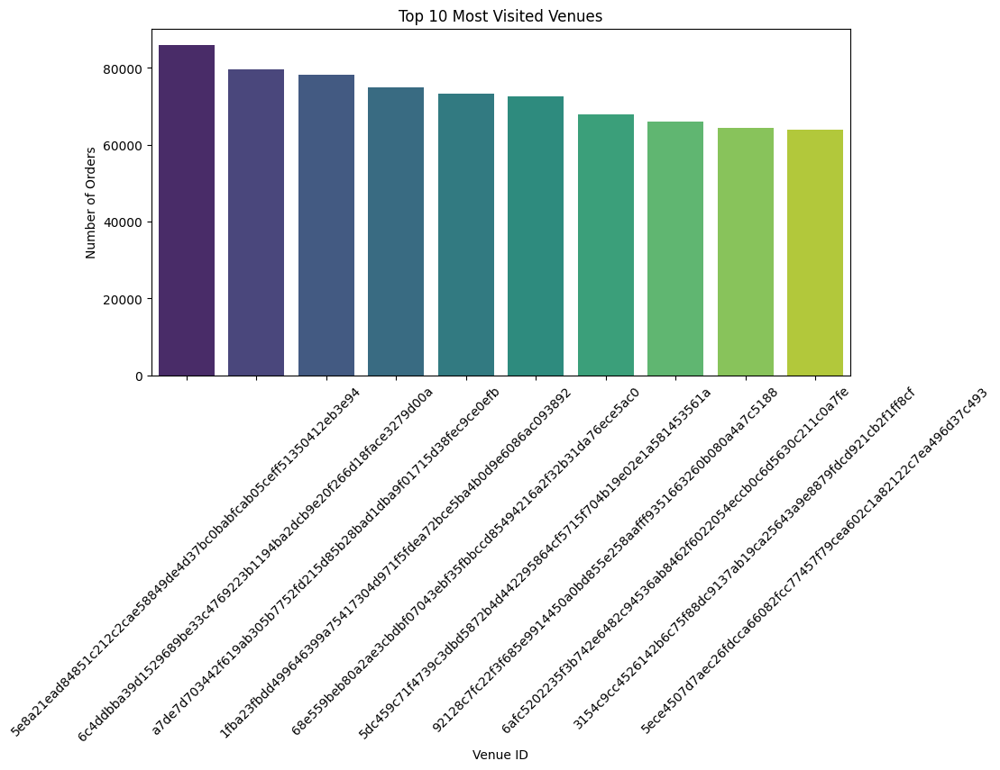

In [15]:
# Group by venue and count the number of unique orders
top_venues = new_df.groupby("venue_xref_id")["order_uuid"].nunique().reset_index()

# Sort in descending order and select the top 10
top_venues = top_venues.sort_values(by="order_uuid", ascending=False).head(10)

# Rename columns for clarity
top_venues.columns = ["venue_xref_id", "total_orders"]

print(top_venues)

plt.figure(figsize=(10, 5))
sns.barplot(data=top_venues, x="venue_xref_id", y="total_orders", palette="viridis")

plt.title("Top 10 Most Visited Venues")
plt.xlabel("Venue ID")
plt.ylabel("Number of Orders")
plt.xticks(rotation=45)
plt.show()

                                         venue_xref_id  total_orders
395  a7de7d703442f619ab305b7752fd215d85b28bad1dba9f...         27127
88   2a1ff30ab693f59dea389a4b12b3de2a14bcbd09aa65e3...         20386
146  3d88429932ded020d0982da1d6dfe3014d6101105493e9...         18435
185  4c0bc5f6bf2386a758dbf37fe805120a1c51be229565c2...         17969
484  d6840e8b800326e509cc7101f06a5167f95bf64ad4f0de...         16387
535  ef3dd3aa8981b6626ff060397fa9086097152b09f0bb5e...         16183
428  bab90d5522cf2e07bd93c20803edd0566dcccb085957d4...         16131
366  9a19e78a140cac85f15f3cb84262a3d83c161737e04d63...         16121
139  3b50a30e79b576bfeb406fce7be10c3d93929d440319bf...         16102
66   1fc4ef37566db934d64af787adc20b3d1bceb44aefdff4...         15655


C:\Users\Shami-uz Zaman\AppData\Local\Temp\ipykernel_17532\4040678975.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_busy_venues, x="venue_xref_id", y="total_orders", palette="coolwarm")


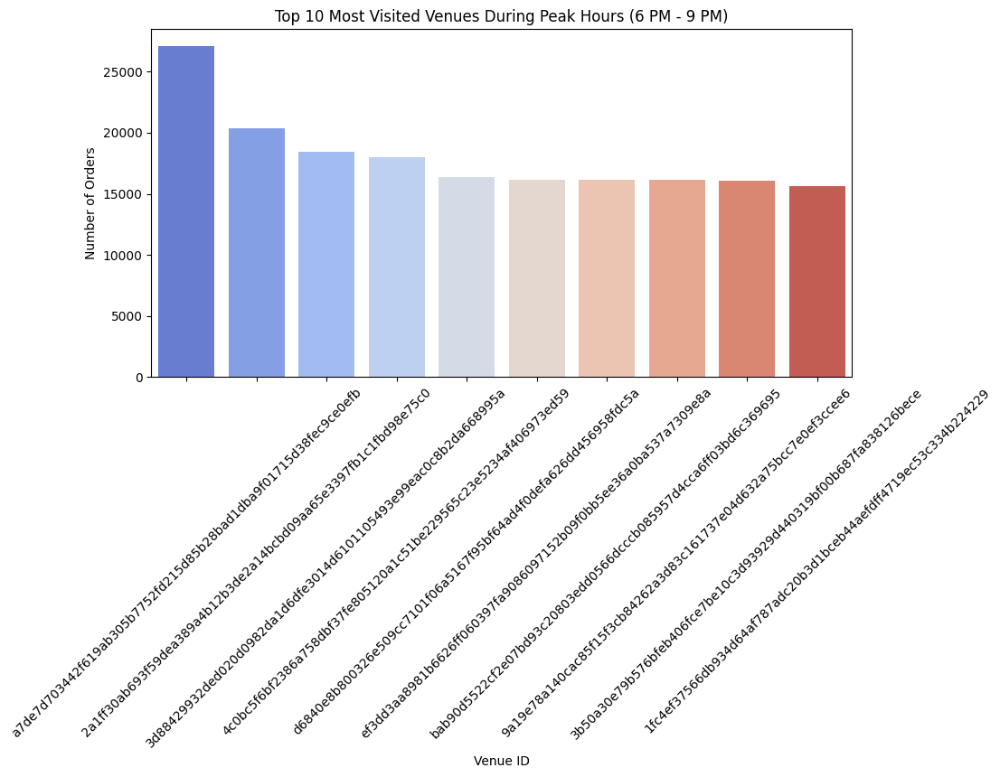

In [16]:
# Define busy hours (e.g., peak times 6 PM - 9 PM)
busy_hours = [18, 19, 20]

# Filter data for busy hours
busy_bills = new_df[new_df["bill_paid_at_local"].dt.hour.isin(busy_hours)]

# Group by venue and count unique orders
top_busy_venues = busy_bills.groupby("venue_xref_id")["order_uuid"].nunique().reset_index()

# Sort in descending order and select the top 10
top_busy_venues = top_busy_venues.sort_values(by="order_uuid", ascending=False).head(10)

# Rename columns for clarity
top_busy_venues.columns = ["venue_xref_id", "total_orders"]

print(top_busy_venues)

plt.figure(figsize=(10, 5))
sns.barplot(data=top_busy_venues, x="venue_xref_id", y="total_orders", palette="coolwarm")

plt.title("Top 10 Most Visited Venues During Peak Hours (6 PM - 9 PM)")
plt.xlabel("Venue ID")
plt.ylabel("Number of Orders")
plt.xticks(rotation=45)
plt.show()

## Customer Spend Insights

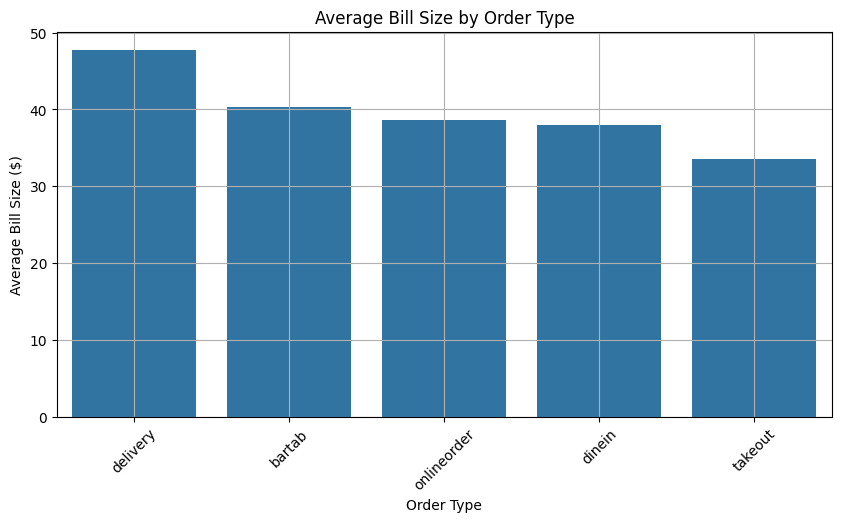

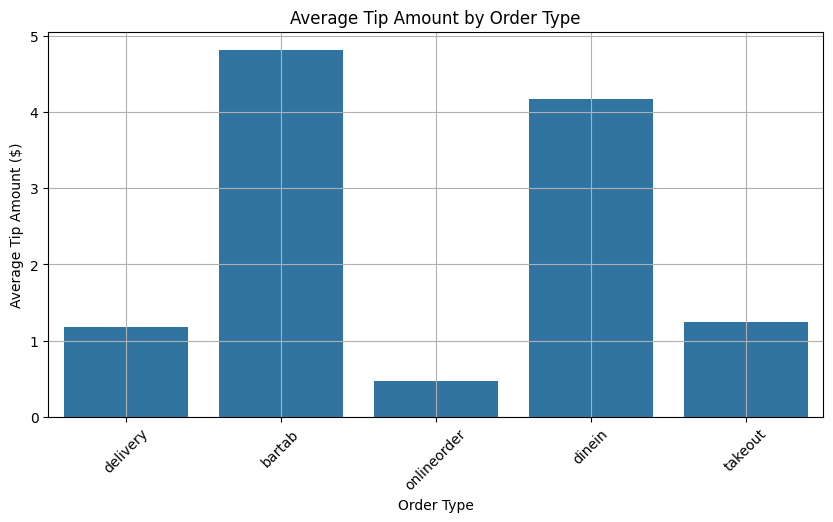

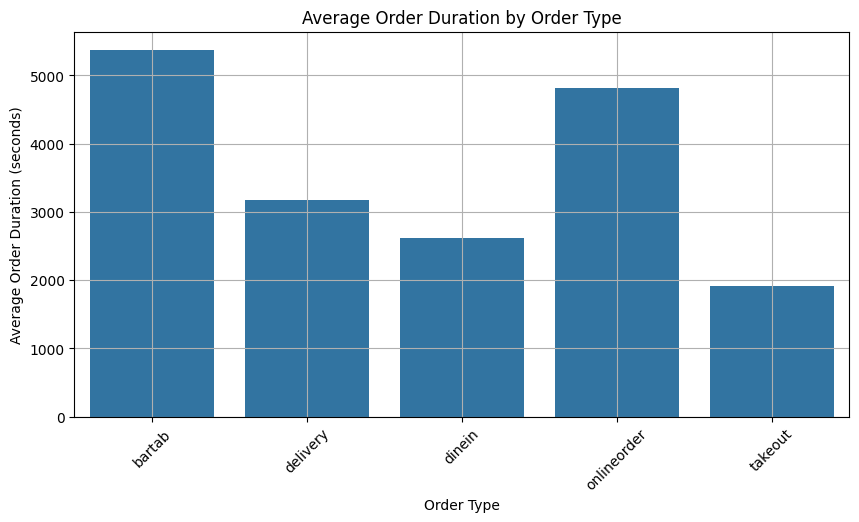

In [40]:
bill_size_by_order_type = new_df.groupby("order_take_out_type_label").agg(
    avg_bill_size=("bill_total_billed", "mean"),
    avg_tip=("payment_total_tip", "mean"),
    order_count=("bill_uuid", "count")
).reset_index()
bill_size_by_order_type = bill_size_by_order_type.sort_values(by="avg_bill_size", ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(data=bill_size_by_order_type, x="order_take_out_type_label", y="avg_bill_size")
plt.title("Average Bill Size by Order Type")
plt.xlabel("Order Type")
plt.ylabel("Average Bill Size ($)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(data=bill_size_by_order_type, x="order_take_out_type_label", y="avg_tip")
plt.title("Average Tip Amount by Order Type")
plt.xlabel("Order Type")
plt.ylabel("Average Tip Amount ($)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

if "order_duration_seconds" in new_df.columns:
    duration_analysis = new_df.groupby("order_take_out_type_label").agg(
        avg_order_duration=("order_duration_seconds", "mean")
    ).reset_index()
    plt.figure(figsize=(10, 5))
    sns.barplot(data=duration_analysis, x="order_take_out_type_label", y="avg_order_duration")
    plt.title("Average Order Duration by Order Type")
    plt.xlabel("Order Type")
    plt.ylabel("Average Order Duration (seconds)")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

## Forecasting Sales Revenue

17:13:30 - cmdstanpy - INFO - Chain [1] start processing
17:13:30 - cmdstanpy - INFO - Chain [1] done processing
17:13:31 - cmdstanpy - INFO - Chain [1] start processing
17:13:31 - cmdstanpy - INFO - Chain [1] done processing
17:13:32 - cmdstanpy - INFO - Chain [1] start processing
17:13:32 - cmdstanpy - INFO - Chain [1] done processing
17:13:32 - cmdstanpy - INFO - Chain [1] start processing
17:13:33 - cmdstanpy - INFO - Chain [1] done processing
17:13:33 - cmdstanpy - INFO - Chain [1] start processing
17:13:34 - cmdstanpy - INFO - Chain [1] done processing
17:13:34 - cmdstanpy - INFO - Chain [1] start processing
17:13:34 - cmdstanpy - INFO - Chain [1] done processing
17:13:35 - cmdstanpy - INFO - Chain [1] start processing
17:13:35 - cmdstanpy - INFO - Chain [1] done processing
17:13:36 - cmdstanpy - INFO - Chain [1] start processing
17:13:36 - cmdstanpy - INFO - Chain [1] done processing
17:13:36 - cmdstanpy - INFO - Chain [1] start processing
17:13:37 - cmdstanpy - INFO - Chain [1]

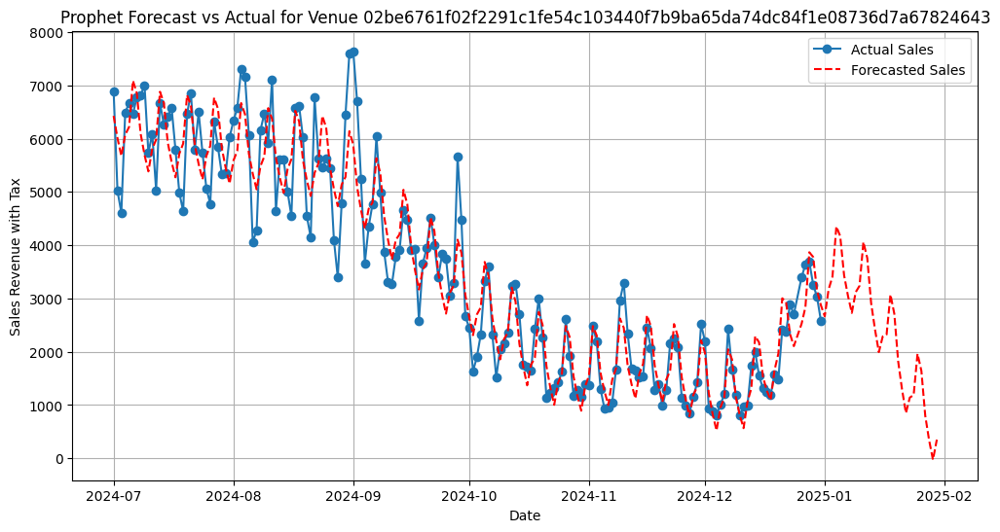

Not enough data for Exponential Smoothing forecast for venue V001.


In [49]:
# We use sales_revenue_with_tax as our target for forecasting
daily_sales = new_df.groupby(["business_date", "venue_xref_id"]).agg(
    total_sales=("sales_revenue_with_tax", "sum")
).reset_index()

# Prepare the data for Prophet:
# Rename columns: ds for date, y for target.
daily_sales["ds"] = pd.to_datetime(daily_sales["business_date"])
daily_sales["y"] = daily_sales["total_sales"]

# Create additional time features (regressor for Prophet)
daily_sales["day_of_week"] = daily_sales["ds"].dt.day_name()
daily_sales["is_weekend"] = daily_sales["day_of_week"].isin(["Saturday", "Sunday"]).astype(int)

# Sort by date for each venue
daily_sales.sort_values("ds", inplace=True)

# ----------------------------
# 3. Forecasting with Prophet (Per Venue)
# ----------------------------
prophet_forecasts = []

# Loop through each unique venue to build a model and forecast 30 days ahead
for venue in daily_sales["venue_xref_id"].unique():
    # Select the data for this venue and only keep needed columns
    venue_data = daily_sales[daily_sales["venue_xref_id"] == venue][["ds", "y", "is_weekend"]].copy()
    
    # Check for a minimum number of records (e.g., at least 2)
    if venue_data.shape[0] < 2:
        print(f"Not enough data for venue {venue}. Skipping Prophet model.")
        continue

    # Initialize Prophet and add the extra regressor
    m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
    m.add_regressor("is_weekend")
    
    try:
        m.fit(venue_data)
    except Exception as e:
        print(f"Error fitting Prophet model for venue {venue}: {e}")
        continue

    # Create future dataframe (forecast next 30 days)
    future = m.make_future_dataframe(periods=30)
    # Ensure the regressor is present in future periods
    future["is_weekend"] = future["ds"].dt.day_name().isin(["Saturday", "Sunday"]).astype(int)
    
    # Generate the forecast
    forecast = m.predict(future)
    forecast["venue_xref_id"] = venue  # Tag forecast with the venue id
    prophet_forecasts.append(forecast)

# Combine forecasts from all venues (if any)
if prophet_forecasts:
    forecast_df = pd.concat(prophet_forecasts, ignore_index=True)
else:
    forecast_df = pd.DataFrame()
    
# Plot the forecast vs. actual sales for a sample venue
if not forecast_df.empty:
    sample_venue = forecast_df["venue_xref_id"].iloc[0]
    sample_actual = daily_sales[daily_sales["venue_xref_id"] == sample_venue]
    sample_forecast = forecast_df[forecast_df["venue_xref_id"] == sample_venue]
    
    plt.figure(figsize=(12, 6))
    plt.plot(sample_actual["ds"], sample_actual["y"], label="Actual Sales", marker="o")
    plt.plot(sample_forecast["ds"], sample_forecast["yhat"], label="Forecasted Sales", linestyle="--", color="red")
    plt.title(f"Prophet Forecast vs Actual for Venue {sample_venue}")
    plt.xlabel("Date")
    plt.ylabel("Sales Revenue with Tax")
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No forecasts were generated using Prophet.")

# ----------------------------
# 4. Forecasting with Exponential Smoothing (for a Selected Venue)
# ----------------------------
# Select a venue to forecast using Exponential Smoothing (adjust venue_id as needed)
venue_id = "V001"  # Replace with a valid venue_xref_id from your data
venue_data_es = daily_sales[daily_sales["venue_xref_id"] == venue_id].copy()

# Check that there are enough days to capture seasonality (e.g., at least 14 days for weekly seasonality)
if len(venue_data_es) < 14:
    print(f"Not enough data for Exponential Smoothing forecast for venue {venue_id}.")
else:
    venue_data_es.sort_values("ds", inplace=True)
    
    try:
        # Define the model with additive trend and seasonal components (seasonal period = 7 for a weekly cycle)
        es_model = ExponentialSmoothing(
            venue_data_es["y"],
            trend="add",
            seasonal="add",
            seasonal_periods=7
        )
        es_fit = es_model.fit()
        forecast_period = 30  # Forecast next 30 days
        es_forecast = es_fit.forecast(steps=forecast_period)
        
        # Create a corresponding date range for the forecast
        future_dates_es = pd.date_range(start=venue_data_es["ds"].max() + pd.Timedelta(days=1), periods=forecast_period)
        es_forecast_df = pd.DataFrame({"ds": future_dates_es, "yhat": es_forecast})
        
        plt.figure(figsize=(12, 6))
        plt.plot(venue_data_es["ds"], venue_data_es["y"], label="Actual Sales", marker="o")
        plt.plot(es_forecast_df["ds"], es_forecast_df["yhat"], label="ES Forecast", marker="o", linestyle="--", color="red")
        plt.title(f"Exponential Smoothing Forecast for Venue {venue_id}")
        plt.xlabel("Date")
        plt.ylabel("Sales Revenue with Tax")
        plt.legend()
        plt.grid(True)
        plt.show()
    except Exception as e:
        print(f"Error in Exponential Smoothing forecast for venue {venue_id}: {e}")

In [43]:
#bills_df = pd.read_csv("bills.csv", parse_dates=["business_date"])

# Fill missing values in the city and concept columns (if necessary)
new_df["city"].fillna("Unknown", inplace=True)
new_df["concept"].fillna("Unknown", inplace=True)

# Aggregate daily sales revenue by venue
daily_sales = new_df.groupby(["business_date", "venue_xref_id"]).agg(
    total_sales=("sales_revenue_with_tax", "sum")
).reset_index()

# Extract day of the week, month, and other seasonal features
daily_sales["day_of_week"] = daily_sales["business_date"].dt.day_name()
daily_sales["month"] = daily_sales["business_date"].dt.month
daily_sales["year"] = daily_sales["business_date"].dt.year

# Let's create lag features (previous day's sales) to capture seasonality
daily_sales["previous_day_sales"] = daily_sales.groupby("venue_xref_id")["total_sales"].shift(1)

# Create a column to identify weekends for seasonality
daily_sales["is_weekend"] = daily_sales["day_of_week"].isin(["Saturday", "Sunday"]).astype(int)

# Handle missing values created due to lag features
daily_sales.fillna(0, inplace=True)

# Show a snapshot of the data
print(daily_sales.head())

  business_date                                      venue_xref_id  \
0    2024-07-01  02be6761f02f2291c1fe54c103440f7b9ba65da74dc84f...   
1    2024-07-01  02fb2dffd171aaf222786c8ad2692aa4fcd35591c443cb...   
2    2024-07-01  03eb6859de0e116c9ab7205692c88a1bcc9974a090bec4...   
3    2024-07-01  052dcdcf2185a3e75c360ecb53d43c7d9849f3db9798c1...   
4    2024-07-01  0584e63a8a4c5040f307ebfc90a206bf66fa75010c6ffc...   

   total_sales day_of_week  month  year  previous_day_sales  is_weekend  
0      6892.37      Monday      7  2024                 0.0           0  
1      2161.45      Monday      7  2024                 0.0           0  
2       647.68      Monday      7  2024                 0.0           0  
3      2616.10      Monday      7  2024                 0.0           0  
4      2149.82      Monday      7  2024                 0.0           0  


In [21]:
new_df.head()

,venue_xref_id,concept,city,country,start_of_day_offset,bill_paid_at_local,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,...,order_uuid,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax,waiter_uuid,hour,day_of_week,is_weekend,month
0,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00,2024-07-19 11:38:03,13.43,0.0,0.0,12.48,...,240719112354~16D0457E-3426-4D27-821B-BACFFA2D4C67,13.43,1,0.0,13.43,c29c030d-ff51-46be-96f0-d7e00ff56a96,11,Friday,False,Jul
1,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00,2024-07-19 12:05:58,12.89,0.0,0.0,11.98,...,240719115311~B69E1B72-B737-4A4A-9544-0DAD947F7326,12.89,1,0.0,12.89,c29c030d-ff51-46be-96f0-d7e00ff56a96,12,Friday,False,Jul
2,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00,2024-07-19 12:35:30,21.02,0.0,0.0,19.53,...,240719122621~42A7592C-8821-4E85-A8FE-C72F45D23048,21.02,1,0.0,21.02,c29c030d-ff51-46be-96f0-d7e00ff56a96,12,Friday,False,Jul
3,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00,2024-07-19 16:37:06,18.28,0.0,0.0,16.98,...,240719163555~E72AAD91-2234-4516-888F-556332409A0B,18.28,1,0.0,18.28,c29c030d-ff51-46be-96f0-d7e00ff56a96,16,Friday,False,Jul
4,ea74268311cfcc47d2b4c38ef08b9dab0117226a9a99a9...,FAST_FOOD,Albuquerque,US,00:00:00,2024-07-20 15:31:44,5.37,0.0,0.0,4.99,...,240720153115~9AD99B33-3CA2-4BE4-A093-D11F9A30B3ED,5.37,1,0.0,5.37,c29c030d-ff51-46be-96f0-d7e00ff56a96,15,Saturday,True,Jul


## Effect of Operational Offsets on Sales

Correlation Matrix:
                      start_of_day_offset  bill_total_net  bill_total_billed  \
start_of_day_offset             1.000000        0.081607           0.083088   
bill_total_net                  0.081607        1.000000           0.998704   
bill_total_billed               0.083088        0.998704           1.000000   
payment_total_tip               0.037656        0.236166           0.236636   

                     payment_total_tip  
start_of_day_offset           0.037656  
bill_total_net                0.236166  
bill_total_billed             0.236636  
payment_total_tip             1.000000  


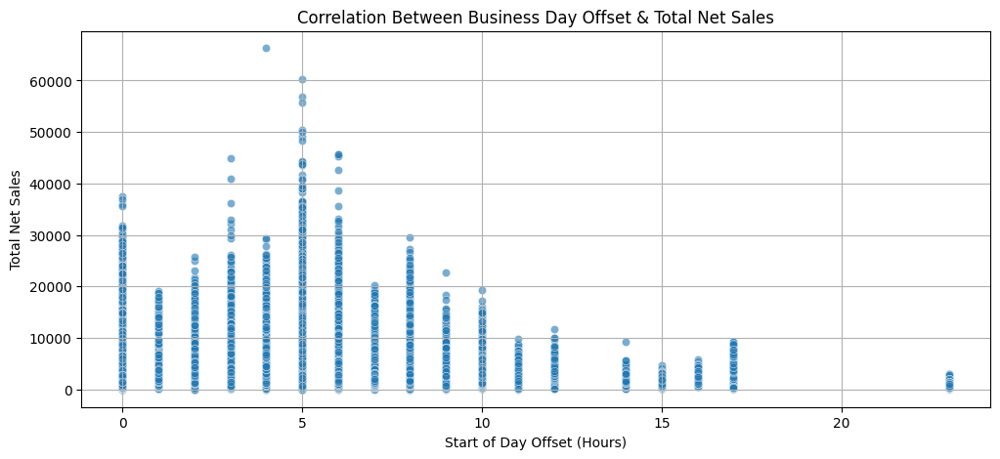

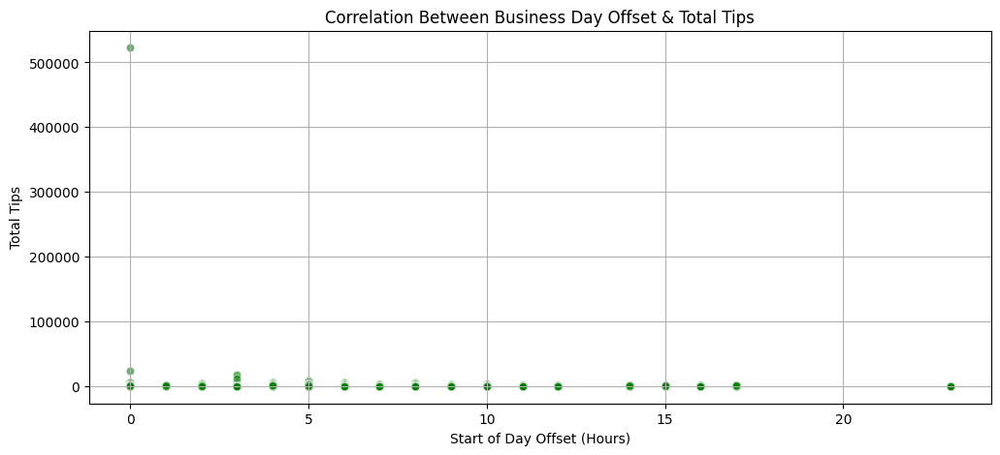

Offset Analysis:
     start_of_day_offset  bill_total_net  bill_total_billed  payment_total_tip
0                   0.0     2796.278145        3025.054168         269.162740
1                   1.0     3102.406723        3421.151266         185.405736
2                   2.0     4174.454257        4574.497383         557.553320
3                   3.0     3839.270718        4144.533865         554.763288
4                   4.0     4646.445657        5074.533795         570.310507
5                   5.0     6629.631224        7174.722029         776.372978
6                   6.0     5033.598495        5429.646057         661.632143
7                   7.0     3913.353986        4295.245593         499.928153
8                   8.0     4944.943745        5389.111527         637.043413
9                   9.0     3409.817502        3734.566906         303.158698
10                 10.0     2780.326819        3001.177597         405.164317
11                 11.0     1963.523548       

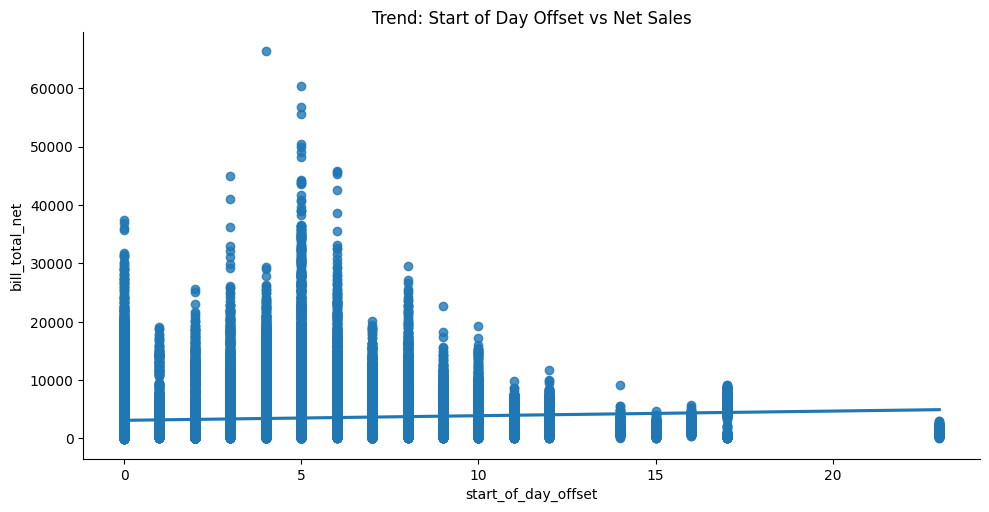

In [44]:
daily_stats = new_df.groupby(["venue_xref_id", "business_date"]).agg({
    "start_of_day_offset": "first",  # Each venue has one offset per day
    "bill_total_net": "sum",
    "bill_total_billed": "sum",
    "payment_total_tip": "sum"
}).reset_index()

correlation_matrix = daily_stats[["start_of_day_offset", "bill_total_net", "bill_total_billed", "payment_total_tip"]].corr()
print("Correlation Matrix:\n", correlation_matrix)

plt.figure(figsize=(12, 5))
sns.scatterplot(data=daily_stats, x="start_of_day_offset", y="bill_total_net", alpha=0.6)
plt.title("Correlation Between Business Day Offset & Total Net Sales")
plt.xlabel("Start of Day Offset (Hours)")
plt.ylabel("Total Net Sales")
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 5))
sns.scatterplot(data=daily_stats, x="start_of_day_offset", y="payment_total_tip", alpha=0.6, color="green")
plt.title("Correlation Between Business Day Offset & Total Tips")
plt.xlabel("Start of Day Offset (Hours)")
plt.ylabel("Total Tips")
plt.grid(True)
plt.show()

offset_analysis = daily_stats.groupby("start_of_day_offset").agg(
    "bill_total_net": "mean",
    "bill_total_billed": "mean",
    "payment_total_tip": "mean"
}).reset_index()
print("Offset Analysis:\n", offset_analysis)

sns.lmplot(data=daily_stats, x="start_of_day_offset", y="bill_total_net", aspect=2)
plt.title("Trend: Start of Day Offset vs Net Sales")
plt.show()

## Waiter Performance Analysis

C:\Users\Shami-uz Zaman\AppData\Local\Temp\ipykernel_17532\3004308811.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_waiters, x="waiter_uuid", y="avg_check_size",  palette="Blues_r")


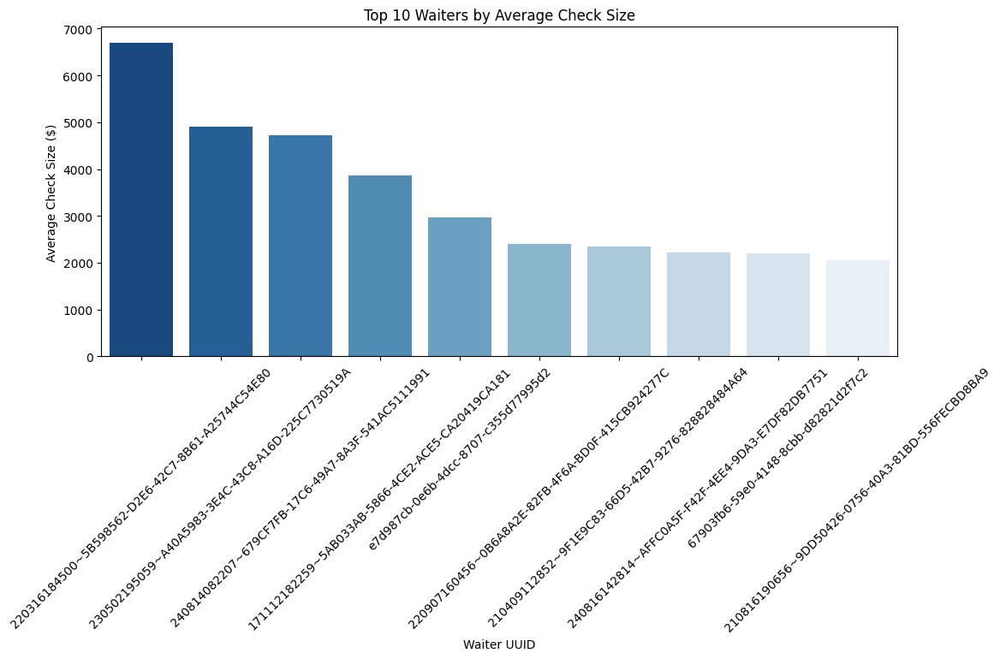

C:\Users\Shami-uz Zaman\AppData\Local\Temp\ipykernel_17532\3004308811.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_tippers, x="waiter_uuid", y="avg_tip_percentage", palette="Greens_r")


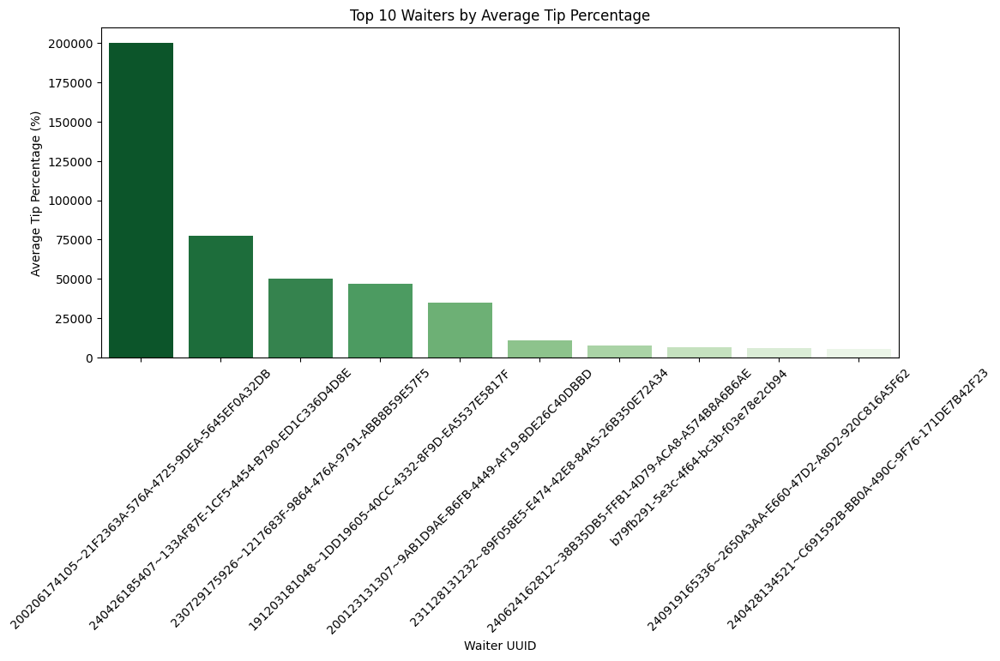

In [46]:
new_df_waiter = new_df.dropna(subset=["waiter_uuid", "bill_total_billed", "payment_total_tip"]).copy()
new_df_waiter["tip_percentage"] = (new_df_waiter["payment_total_tip"] / new_df_waiter["bill_total_billed"]) * 100

waiter_stats = new_df_waiter.groupby("waiter_uuid").agg(
    avg_check_size=("bill_total_billed", "mean"),
    avg_tip_percentage=("tip_percentage", "mean"),
    total_bills=("bill_total_billed", "count")
).reset_index()

top_waiters = waiter_stats.sort_values(by="avg_check_size", ascending=False).head(10)
plt.figure(figsize=(12, 5))
sns.barplot(data=top_waiters, x="waiter_uuid", y="avg_check_size",  palette="Blues_r")
plt.xticks(rotation=45)
plt.title("Top 10 Waiters by Average Check Size")
plt.xlabel("Waiter UUID")
plt.ylabel("Average Check Size ($)")
plt.show()

top_tippers = waiter_stats.sort_values(by="avg_tip_percentage", ascending=False).head(10)
plt.figure(figsize=(12, 5))
sns.barplot(data=top_tippers, x="waiter_uuid", y="avg_tip_percentage", palette="Greens_r")
plt.xticks(rotation=45)
plt.title("Top 10 Waiters by Average Tip Percentage")
plt.xlabel("Waiter UUID")
plt.ylabel("Average Tip Percentage (%)")
plt.show()

### Weather Data Correlation

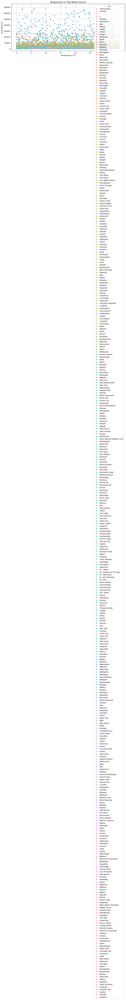

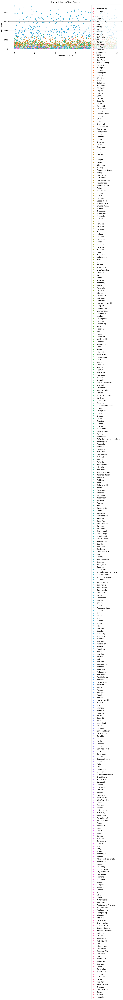

In [24]:
# (For demonstration, we simulate weather data.)
unique_dates = pd.to_datetime(new_df["business_date"].dropna().unique())
cities = new_df["city"].dropna().unique()

# Create a weather dataframe with every combination of date and city
weather_data = pd.DataFrame([(date, city) for date in unique_dates for city in cities],
                            columns=["business_date", "city"])
np.random.seed(42)
weather_data["temperature"] = np.random.uniform(0, 35, len(weather_data))   # in Celsius
weather_data["precipitation"] = np.random.uniform(0, 10, len(weather_data))   # in mm

# Aggregate daily sales by city and business_date
daily_sales_city = new_df.groupby(["business_date", "city"]).agg(
    total_billed=("bill_total_billed", "sum"),
    total_orders=("order_uuid", "count")
).reset_index()

# Merge weather data with daily sales
weather_sales = pd.merge(daily_sales_city, weather_data, on=["business_date", "city"], how="left")

# Visualize: Temperature vs Total Billed
plt.figure(figsize=(12, 5))
sns.scatterplot(data=weather_sales, x="temperature", y="total_billed", hue="city")
plt.title("Temperature vs Total Billed Amount")
plt.xlabel("Temperature (°C)")
plt.ylabel("Total Billed ($)")
plt.grid(True)
plt.show()

# Visualize: Precipitation vs Total Orders
plt.figure(figsize=(12, 5))
sns.scatterplot(data=weather_sales, x="precipitation", y="total_orders", hue="city")
plt.title("Precipitation vs Total Orders")
plt.xlabel("Precipitation (mm)")
plt.ylabel("Total Orders")
plt.grid(True)
plt.show()

##  Holiday or Day-of-Week Impact on Sales

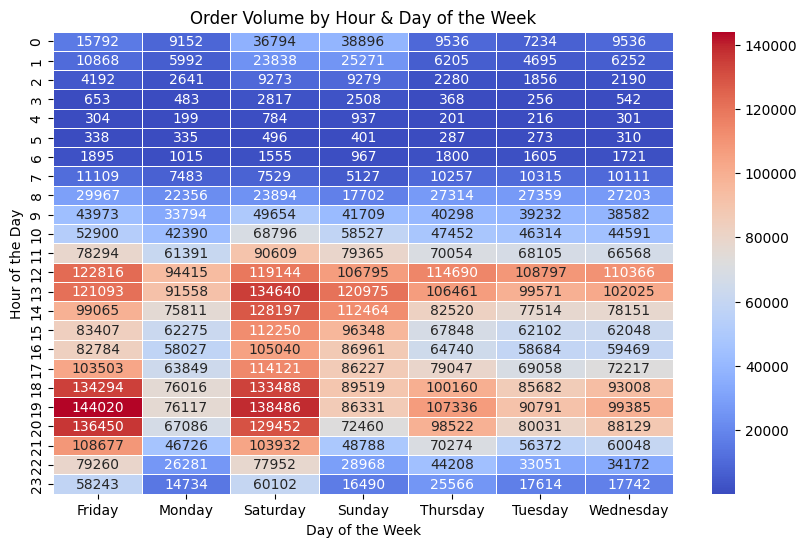

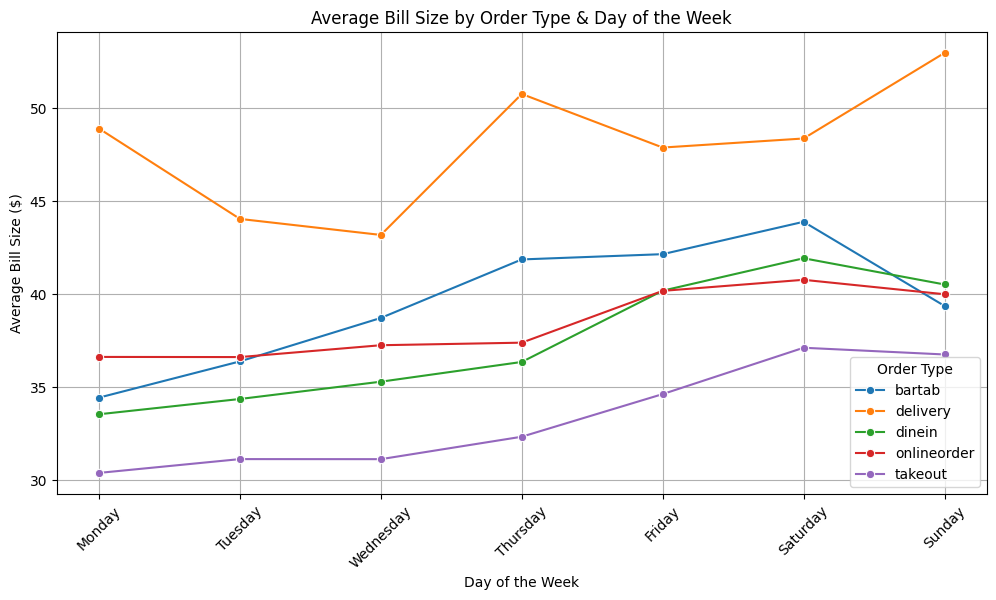

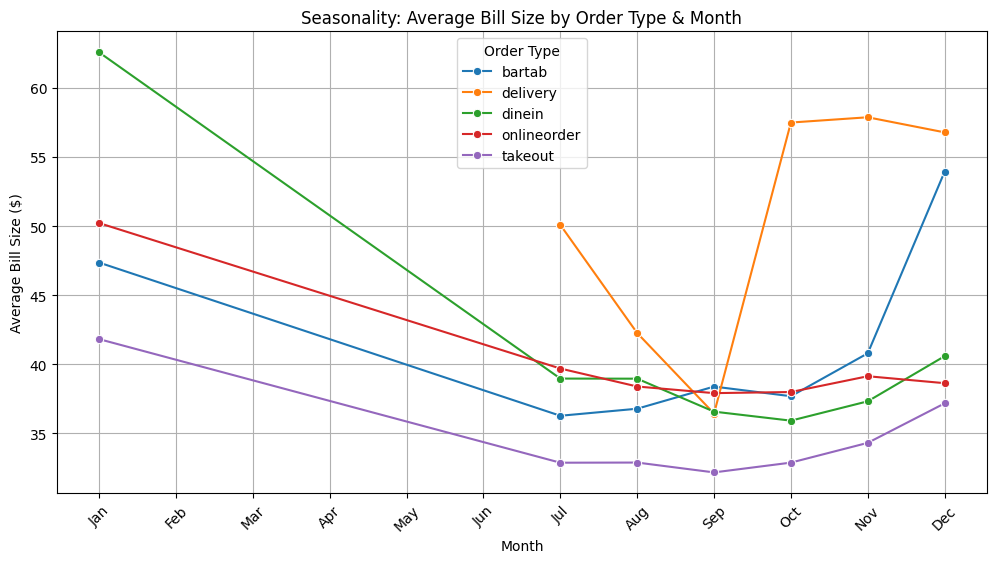

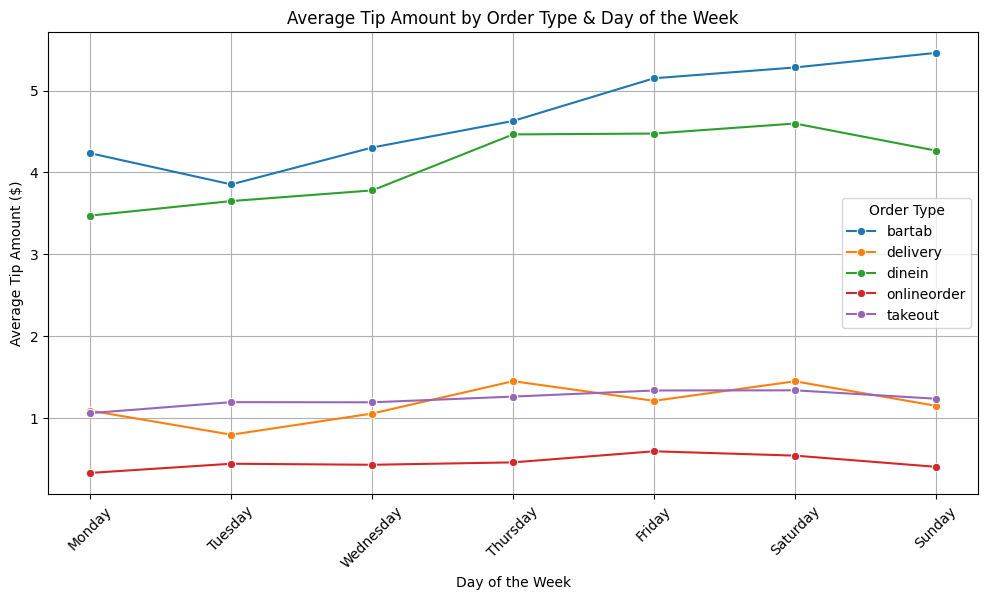

In [47]:
# Heatmap of orders by hour and day-of-week
pivot_table = new_df.pivot_table(index=new_df["bill_paid_at_local"].dt.hour,
                                 columns=new_df["bill_paid_at_local"].dt.day_name(),
                                 values="order_uuid", aggfunc="count")
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, cmap="coolwarm", annot=True, fmt=".0f", linewidths=0.5)
plt.title("Order Volume by Hour & Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Hour of the Day")
plt.show()

# Day-of-Week Trends for Average Bill Size
new_df["month"] = new_df["bill_paid_at_local"].dt.strftime("%b")
day_of_week_trends = new_df.groupby(["day_of_week", "order_take_out_type_label"]).agg(
    avg_bill_size=("bill_total_billed", "mean"),
    avg_tip=("payment_total_tip", "mean"),
    order_count=("bill_uuid", "count")
).reset_index()
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
day_of_week_trends["day_of_week"] = pd.Categorical(day_of_week_trends["day_of_week"], 
                                                  categories=day_order, ordered=True)

plt.figure(figsize=(12, 6))
sns.lineplot(data=day_of_week_trends, x="day_of_week", y="avg_bill_size",
             hue="order_take_out_type_label", marker="o")
plt.title("Average Bill Size by Order Type & Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Average Bill Size ($)")
plt.xticks(rotation=45)
plt.legend(title="Order Type")
plt.grid(True)
plt.show()

# Monthly Trends for Average Bill Size
monthly_trends = new_df.groupby(["month", "order_take_out_type_label"]).agg(
    avg_bill_size=("bill_total_billed", "mean"),
    avg_tip=("payment_total_tip", "mean"),
    order_count=("bill_uuid", "count")
).reset_index()
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
monthly_trends["month"] = pd.Categorical(monthly_trends["month"], categories=month_order, ordered=True)

plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_trends, x="month", y="avg_bill_size",
             hue="order_take_out_type_label", marker="o")
plt.title("Seasonality: Average Bill Size by Order Type & Month")
plt.xlabel("Month")
plt.ylabel("Average Bill Size ($)")
plt.xticks(rotation=45)
plt.legend(title="Order Type")
plt.grid(True)
plt.show()

# Tip trends by day-of-week
plt.figure(figsize=(12, 6))
sns.lineplot(data=day_of_week_trends, x="day_of_week", y="avg_tip",
             hue="order_take_out_type_label", marker="o")
plt.title("Average Tip Amount by Order Type & Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Average Tip Amount ($)")
plt.xticks(rotation=45)
plt.legend(title="Order Type")
plt.grid(True)
plt.show()

## Tip Culture by Geo

Top Cities by Tip Percentage:
              city  avg_tip_amount  avg_tip_percentage  num_bills
61      Cedartown        5.228590         1456.663457       6463
212        Naples        6.059746         1299.714426       6256
283     Roseville       21.156823          809.060954       6273
164     Kimberley       29.433145          677.266580       6317
94         Delta        13.003250          547.072946       6541
370  West Kelowna       11.649260          541.922473      18608
270        Regina        5.768081          468.712812       5989
18         Austin       22.050260          410.097790       6298
291     Santa Ana       17.537565          334.041265      16472
93          Delta        8.765065          282.278452      19910
Top Countries by Tip Percentage:
   country  avg_tip_amount  avg_tip_percentage  num_bills
0      CA        3.449548           61.054201    5498931
1      US        4.303625           31.720924    3179768


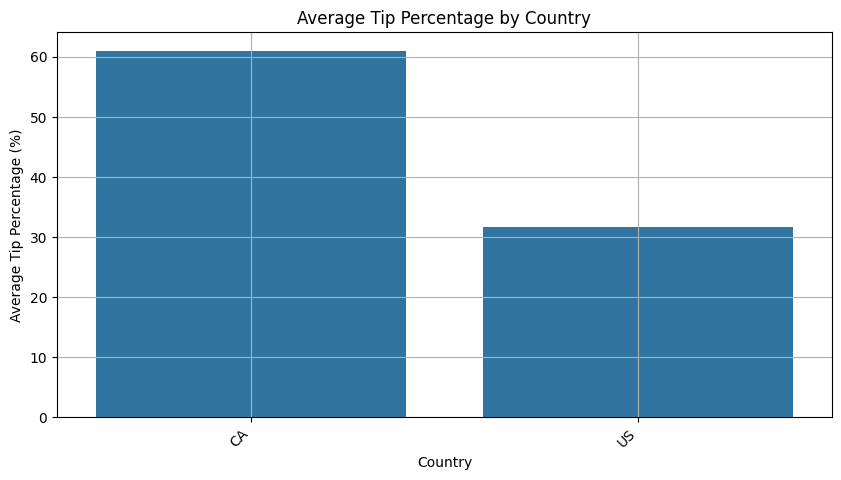

Correlation Matrix for Tip Culture:
                    tip_percentage  city_code  country_code  order_type_code  \
tip_percentage           1.000000   0.000294     -0.002417        -0.002566   
city_code                0.000294   1.000000     -0.201229         0.001621   
country_code            -0.002417  -0.201229      1.000000         0.072175   
order_type_code         -0.002566   0.001621      0.072175         1.000000   
bill_total_billed       -0.003196  -0.001270      0.008165        -0.016711   

                   bill_total_billed  
tip_percentage             -0.003196  
city_code                  -0.001270  
country_code                0.008165  
order_type_code            -0.016711  
bill_total_billed           1.000000  


In [48]:
new_df_tip = new_df.dropna(subset=["payment_total_tip", "bill_total_billed"]).copy()
new_df_tip = new_df_tip[new_df_tip["bill_total_billed"] != 0]
new_df_tip["tip_percentage"] = (new_df_tip["payment_total_tip"] / new_df_tip["bill_total_billed"]) * 100

# Aggregate tip metrics by city
city_tips = new_df_tip.groupby("city").agg(
    avg_tip_amount=("payment_total_tip", "mean"),
    avg_tip_percentage=("tip_percentage", "mean"),
    num_bills=("bill_total_billed", "count")
).reset_index()
city_tips = city_tips.sort_values(by="avg_tip_percentage", ascending=False)
print("Top Cities by Tip Percentage:\n", city_tips.head(10))

# Aggregate tip metrics by country
country_tips = new_df_tip.groupby("country").agg(
    avg_tip_amount=("payment_total_tip", "mean"),
    avg_tip_percentage=("tip_percentage", "mean"),
    num_bills=("bill_total_billed", "count")
).reset_index()
country_tips = country_tips.sort_values(by="avg_tip_percentage", ascending=False)
print("Top Countries by Tip Percentage:\n", country_tips.head(10))

plt.figure(figsize=(10, 5))
sns.barplot(data=country_tips, x="country", y="avg_tip_percentage")
plt.xticks(rotation=45, ha="right")
plt.title("Average Tip Percentage by Country")
plt.xlabel("Country")
plt.ylabel("Average Tip Percentage (%)")
plt.grid(True)
plt.show()

# Group by venue concept and city
venue_tips = new_df_tip.groupby(["concept", "city"]).agg(
    avg_tip_percentage=("tip_percentage", "mean"),
    num_bills=("bill_total_billed", "count")
).reset_index()
venue_tips = venue_tips.sort_values(by="avg_tip_percentage", ascending=False)

g = sns.catplot(
    data=venue_tips, 
    x="concept", 
    y="avg_tip_percentage", 
    col="city", 
    kind="bar",
    col_wrap=3,
    height=4,
    aspect=1.2
)
g.set_xticklabels(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Convert categorical columns to numeric codes and compute correlations
new_df_tip["city_code"] = new_df_tip["city"].astype("category").cat.codes
new_df_tip["country_code"] = new_df_tip["country"].astype("category").cat.codes
new_df_tip["order_type_code"] = new_df_tip["order_take_out_type_label"].astype("category").cat.codes

corr_df = new_df_tip[["tip_percentage", "city_code", "country_code", "order_type_code", "bill_total_billed"]]
correlation_matrix_tip = corr_df.corr()
print("Correlation Matrix for Tip Culture:\n", correlation_matrix_tip)


## Comparing Public Inflation Data and Sales

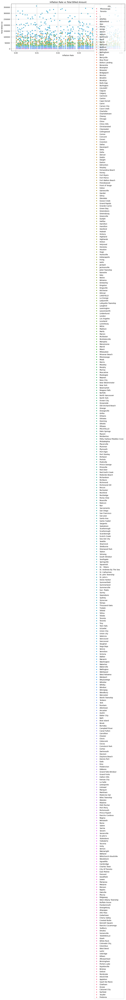

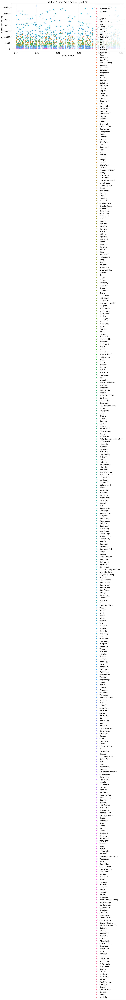

In [31]:
unique_dates = pd.to_datetime(new_df["business_date"].dropna().unique())
inflation_data = pd.DataFrame({"business_date": unique_dates})
np.random.seed(42)
inflation_data["inflation_rate"] = np.random.uniform(0, 0.05, len(inflation_data))  # Simulated rate

daily_sales_infl = new_df.groupby(["business_date", "city"]).agg(
    total_billed=("bill_total_billed", "sum"),
    total_net=("bill_total_net", "sum"),
    total_sales_with_tax=("sales_revenue_with_tax", "sum")
).reset_index()

inflation_merge = pd.merge(daily_sales_infl, inflation_data, on="business_date", how="left")

plt.figure(figsize=(12, 5))
sns.scatterplot(data=inflation_merge, x="inflation_rate", y="total_billed", hue="city")
plt.title("Inflation Rate vs Total Billed Amount")
plt.xlabel("Inflation Rate")
plt.ylabel("Total Billed ($)")
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 5))
sns.scatterplot(data=inflation_merge, x="inflation_rate", y="total_sales_with_tax", hue="city")
plt.title("Inflation Rate vs Sales Revenue (with Tax)")
plt.xlabel("Inflation Rate")
plt.ylabel("Sales Revenue with Tax ($)")
plt.grid(True)
plt.show()